.


**1. FACE DETECTION**

In [8]:
!pip install mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 28.2 MB/s eta 0:00:00


In [ ]:
!unzip /content/pics_used.zip

Archive:  /content/pics_used.zip
  inflating: The_Avengers_NY.png     
  inflating: mugshot-photos-of-random-model-min.jpg  


In [10]:
import mediapipe as mp
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
img_path = "/content/mugshot-photos-of-random-model-min.jpg"

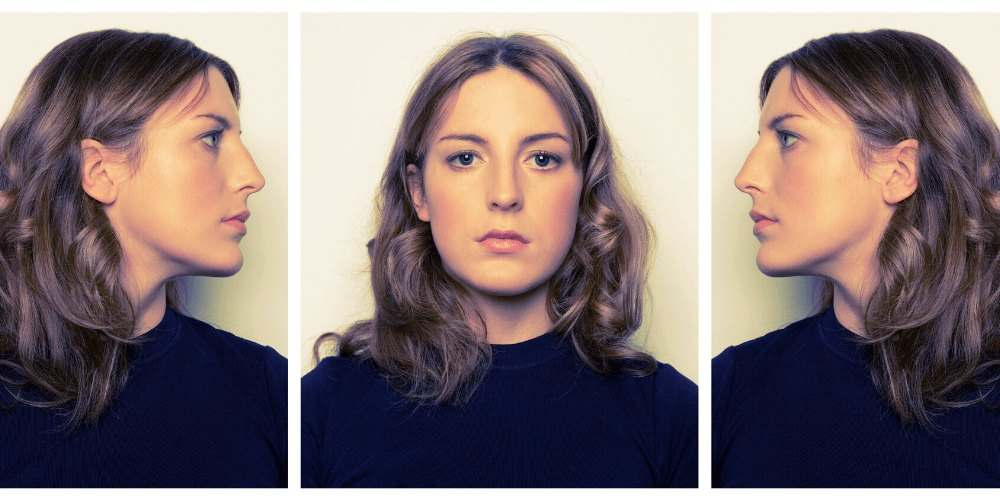

In [ ]:
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
cv2_imshow(img)

In [13]:
mp.solutions.face_detection.FaceDetection(model_selection=0)

In [15]:
mp_face_detection = mp.solutions.face_detection
mp_drawing = mp.solutions.drawing_utils

In [14]:
with mp_face_detection.FaceDetection(model_selection=1) as face_detection:
  results = face_detection.process(img_rgb)

  for detection in results.detections:
    mp_drawing.draw_detection(img, detection)
cv2_imshow(img)

NameError: name 'mp_face_detection' is not defined

0.9692914485931396
0.8731189966201782
0.8244432806968689


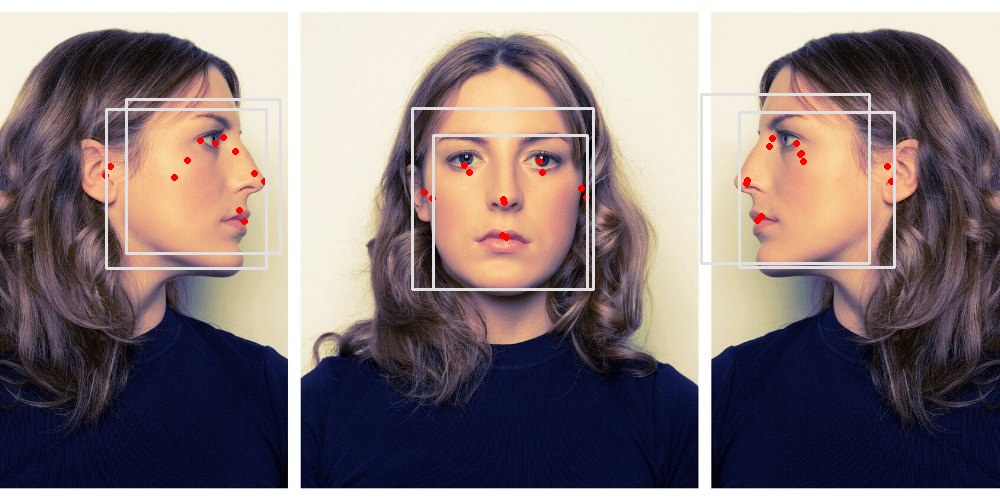

In [ ]:
with mp_face_detection.FaceDetection(model_selection=0) as face_detection:
    results = face_detection.process(img_rgb)

    if results.detections:
        for detection in results.detections:
          print(detection.score[0])
          mp_drawing.draw_detection(img, detection)
    else:
        print("No faces detected.")

cv2_imshow(img)

In [ ]:
dets = results.detections
for det in dets:
  break
det

label_id: 0
score: 0.969291449
location_data {
  format: RELATIVE_BOUNDING_BOX
  relative_bounding_box {
    xmin: 0.43375048
    ymin: 0.271073937
    width: 0.154050082
    height: 0.3081007
  }
  relative_keypoints {
    x: 0.469636947
    y: 0.345424831
  }
  relative_keypoints {
    x: 0.542856097
    y: 0.345285714
  }
  relative_keypoints {
    x: 0.504243493
    y: 0.405271232
  }
  relative_keypoints {
    x: 0.506390214
    y: 0.475705683
  }
  relative_keypoints {
    x: 0.43257755
    y: 0.396905422
  }
  relative_keypoints {
    x: 0.586797178
    y: 0.395026982
  }
}

In [ ]:
ih, iw, _ = img_rgb.shape
bbocC = det.location_data.relative_bounding_box
x_min = int(bboxC.xmin * iw)
y_min = int(bboxC.ymin * ih)
box_width = int(bboxC.width * iw)
box_height = int(bboxC.height * ih)

print(x_min, y_min, box_width, box_height)

106 109 159 159


      Index	Keypoint
      0	    Left eye
      1	    Right eye
      2	    Nose tip
      3	    Mouth center
      4	    Right ear tragus
      5	    Left ear tragus

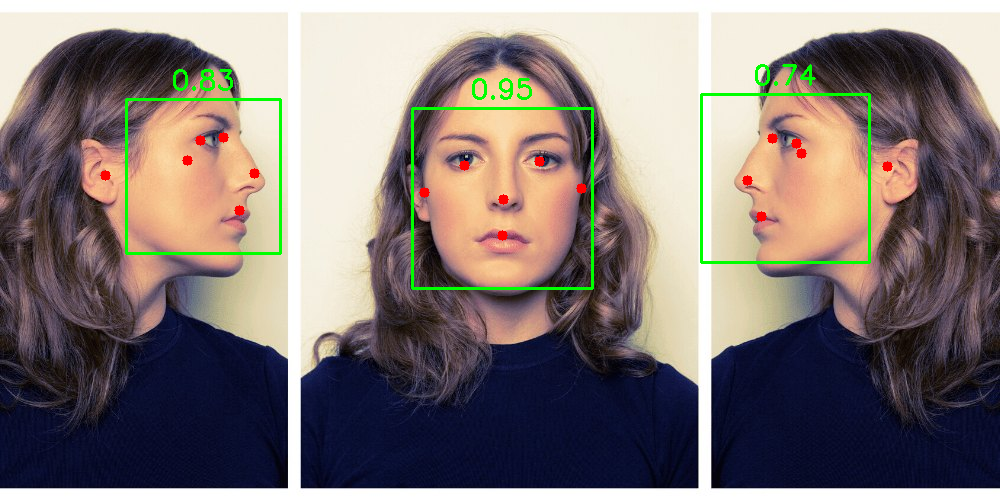

In [ ]:
img_path = "/content/mugshot-photos-of-random-model-min.jpg"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# cv2_imshow(img)

with mp_face_detection.FaceDetection(model_selection=1, min_detection_confidence=0.5) as face_detection:
    results = face_detection.process(img_rgb)

    if results.detections:
        for detection in results.detections:
          bboxC = detection.location_data.relative_bounding_box
          ih, iw, _ = img_rgb.shape
          x_min = int(bboxC.xmin * iw)
          y_min = int(bboxC.ymin * ih)
          box_width = int(bboxC.width * iw)
          box_height = int(bboxC.height * ih)

          keypoints = detection.location_data.relative_keypoints
          for kp in keypoints:
            kp_x = int(kp.x * iw)
            kp_y = int(kp.y * ih)
            cv2.circle(img, (kp_x, kp_y), 5, (0, 0, 255), -1)


          score = detection.score[0]
          label = f'{score:.2f}'
          (text_width, text_height), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
          text_x = x_min + (box_width // 2) - (text_width // 2)
          text_y = y_min - 10
          cv2.putText(img, label, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

          cv2.rectangle(img, (x_min, y_min), (x_min + box_width, y_min + box_height), (0, 255, 0), 2)
    else:
        print("No faces detected.")
cv2_imshow(img)

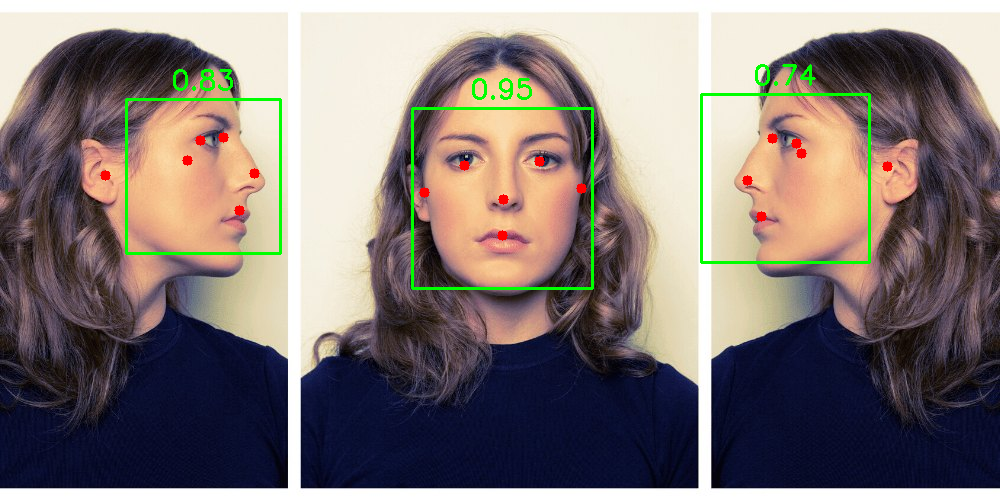

In [ ]:
import numpy as np
img_path = "/content/mugshot-photos-of-random-model-min.jpg"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# cv2_imshow(img)
face_crops = []
with mp_face_detection.FaceDetection(model_selection=1) as face_detection:
    results = face_detection.process(img_rgb)

    if results.detections:
        for detection in results.detections:
          bboxC = detection.location_data.relative_bounding_box
          ih, iw, _ = img_rgb.shape
          x_min = int(bboxC.xmin * iw) #top left
          y_min = int(bboxC.ymin * ih) #top left
          box_width = int(bboxC.width * iw)
          box_height = int(bboxC.height * ih)

          keypoints = detection.location_data.relative_keypoints
          for kp in keypoints:
            kp_x = int(kp.x * iw)
            kp_y = int(kp.y * ih)
            cv2.circle(img, (kp_x, kp_y), 5, (0, 0, 255), -1)


          score = detection.score[0]
          label = f'{score:.2f}'
          (text_width, text_height), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
          text_x = x_min + (box_width // 2) - (text_width // 2)
          text_y = y_min - 10
          cv2.putText(img, label, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

          cv2.rectangle(img, (x_min, y_min), (x_min + box_width, y_min + box_height), (0, 255, 0), 2)

          x_min_crop = max(x_min, 0)
          y_min_crop = max(y_min, 0)
          x_max_crop = min(x_min + box_width, iw)
          y_max_crop = min(y_min + box_height, ih)

          face_crop = img[y_min_crop:y_max_crop, x_min_crop:x_max_crop]
          left_eye = keypoints[1]
          right_eye = keypoints[0]

          left_eye_x = (left_eye.x * iw) - x_min_crop
          left_eye_y = (left_eye.y * ih) - y_min_crop
          right_eye_x = (right_eye.x * iw) - x_min_crop
          right_eye_y = (right_eye.y * ih) - y_min_crop


          dx = right_eye_x - left_eye_x
          dy = right_eye_y - left_eye_y
          angle = -np.degrees(np.arctan2(dy, dx))
          eyes_center = ((left_eye_x + right_eye_x) / 2, (left_eye_y + right_eye_y) / 2)

          rot_mat = cv2.getRotationMatrix2D(eyes_center, angle, 1.0)
          rotated_crop = cv2.warpAffine(face_crop, rot_mat, (face_crop.shape[1], face_crop.shape[0]), flags=cv2.INTER_CUBIC)

          face_crops.append(rotated_crop)



    else:
        print("No faces detected.")
cv2_imshow(img)

# Alignment

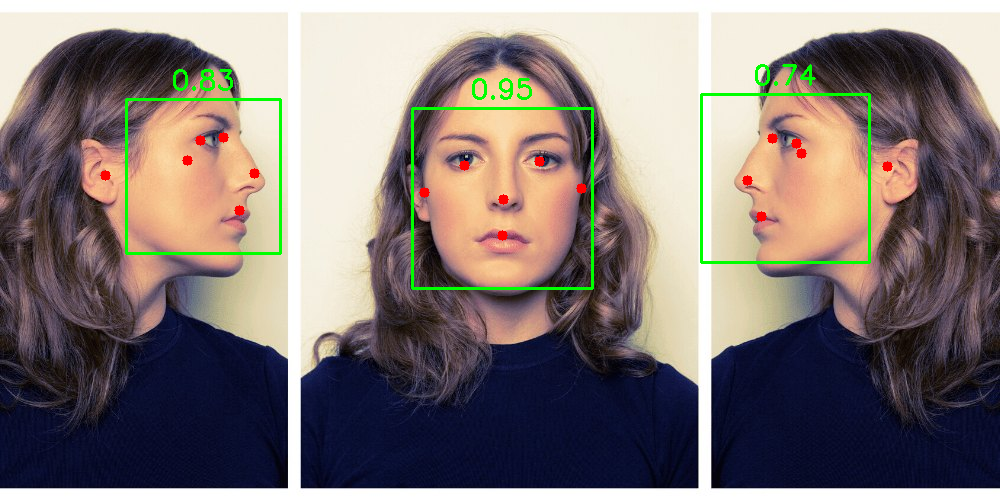

In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow  # Remove if not using Colab

mp_face_detection = mp.solutions.face_detection

# Load the image
img_path = "/content/mugshot-photos-of-random-model-min.jpg"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

face_crops = []

# Initialize MediaPipe Face Detection
with mp_face_detection.FaceDetection(model_selection=1, min_detection_confidence=0.5) as face_detection:
    results = face_detection.process(img_rgb)

    if results.detections:
        for detection in results.detections:
            ih, iw, _ = img.shape

            bboxC = detection.location_data.relative_bounding_box
            x_min = int(bboxC.xmin * iw)
            y_min = int(bboxC.ymin * ih)
            box_width = int(bboxC.width * iw)
            box_height = int(bboxC.height * ih)

            keypoints = detection.location_data.relative_keypoints
            for kp in keypoints:
              kp_x = int(kp.x * iw)
              kp_y = int(kp.y * ih)
              cv2.circle(img, (kp_x, kp_y), 5, (0, 0, 255), -1)

            score = detection.score[0]
            label = f'{score:.2f}'

            (text_width, text_height), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
            text_x = x_min + (box_width // 2) - (text_width // 2)
            text_y = y_min - 10
            cv2.putText(img, label, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

            cv2.rectangle(img, (x_min, y_min), (x_min + box_width, y_min + box_height), (0, 255, 0), 2)


            x_min_crop = max(x_min, 0)
            y_min_crop = max(y_min, 0)
            x_max_crop = min(x_min + box_width, iw)
            y_max_crop = min(y_min + box_height, ih)

            face_crop = img[y_min_crop:y_max_crop, x_min_crop:x_max_crop]



            left_eye = keypoints[0]
            right_eye = keypoints[1]

            left_eye_x = (left_eye.x * iw) - x_min_crop
            left_eye_y = (left_eye.y * ih) - y_min_crop
            right_eye_x = (right_eye.x * iw) - x_min_crop
            right_eye_y = (right_eye.y * ih) - y_min_crop

            dx = right_eye_x - left_eye_x
            dy = right_eye_y - left_eye_y
            angle = np.degrees(np.arctan2(dy, dx))

            eyes_center = ((left_eye_x + right_eye_x) / 2, (left_eye_y + right_eye_y) / 2)

            rot_mat = cv2.getRotationMatrix2D(eyes_center, angle, 1.0)

            rotated_crop = cv2.warpAffine(face_crop, rot_mat, (face_crop.shape[1], face_crop.shape[0]), flags=cv2.INTER_CUBIC)



            face_crops.append(rotated_crop)

    else:
        print("No faces detected.")
cv2_imshow(img)

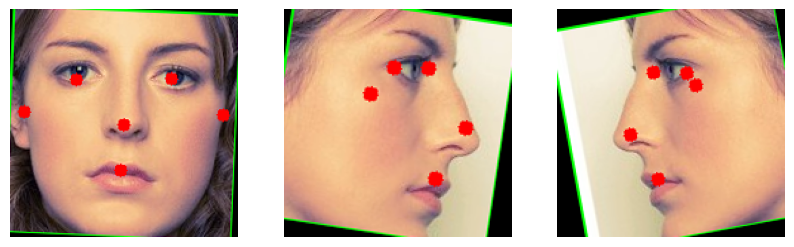

In [ ]:
plt.figure(figsize=(10, 10))
for i, face_crop in enumerate(face_crops):
    plt.subplot(1, 3, i+1)
    plt.imshow(cv2.cvtColor(face_crop, cv2.COLOR_BGR2RGB))
    plt.axis('off')

# Not good enough

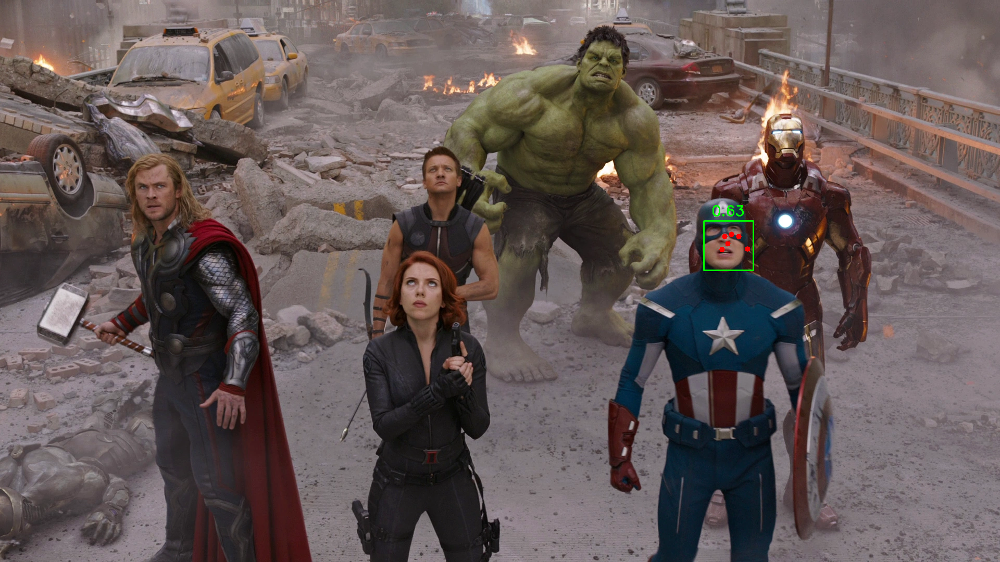

In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow  # Remove if not using Colab

mp_face_detection = mp.solutions.face_detection

# Load the image
img_path = "/content/The_Avengers_NY.png"
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

face_crops = []

# Initialize MediaPipe Face Detection
with mp_face_detection.FaceDetection(model_selection=1, min_detection_confidence=0.5) as face_detection:
    results = face_detection.process(img_rgb)

    if results.detections:
        for detection in results.detections:
            ih, iw, _ = img.shape

            bboxC = detection.location_data.relative_bounding_box
            x_min = int(bboxC.xmin * iw)
            y_min = int(bboxC.ymin * ih)
            box_width = int(bboxC.width * iw)
            box_height = int(bboxC.height * ih)

            keypoints = detection.location_data.relative_keypoints
            for kp in keypoints:
              kp_x = int(kp.x * iw)
              kp_y = int(kp.y * ih)
              cv2.circle(img, (kp_x, kp_y), 5, (0, 0, 255), -1)

            score = detection.score[0]
            label = f'{score:.2f}'

            (text_width, text_height), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
            text_x = x_min + (box_width // 2) - (text_width // 2)
            text_y = y_min - 10
            cv2.putText(img, label, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

            cv2.rectangle(img, (x_min, y_min), (x_min + box_width, y_min + box_height), (0, 255, 0), 2)


            x_min_crop = max(x_min, 0)
            y_min_crop = max(y_min, 0)
            x_max_crop = min(x_min + box_width, iw)
            y_max_crop = min(y_min + box_height, ih)

            face_crop = img[y_min_crop:y_max_crop, x_min_crop:x_max_crop]



            left_eye = keypoints[0]
            right_eye = keypoints[1]

            left_eye_x = (left_eye.x * iw) - x_min_crop
            left_eye_y = (left_eye.y * ih) - y_min_crop
            right_eye_x = (right_eye.x * iw) - x_min_crop
            right_eye_y = (right_eye.y * ih) - y_min_crop

            dx = right_eye_x - left_eye_x
            dy = right_eye_y - left_eye_y
            angle = np.degrees(np.arctan2(dy, dx))

            eyes_center = ((left_eye_x + right_eye_x) / 2, (left_eye_y + right_eye_y) / 2)

            rot_mat = cv2.getRotationMatrix2D(eyes_center, angle, 1.0)

            rotated_crop = cv2.warpAffine(face_crop, rot_mat, (face_crop.shape[1], face_crop.shape[0]), flags=cv2.INTER_CUBIC)



            face_crops.append(rotated_crop)

    else:
        print("No faces detected.")
cv2_imshow(img)

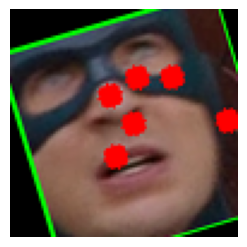

In [ ]:
plt.figure(figsize=(10, 10))
for i, face_crop in enumerate(face_crops):
    plt.subplot(1, 3, i+1)
    plt.imshow(cv2.cvtColor(face_crop, cv2.COLOR_BGR2RGB))
    plt.axis('off')

.

**2. FACE RECOGNITION**

In [2]:
!pip install insightface onnxruntime

  Using cached insightface-0.7.3.tar.gz (439 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 73.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 70.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.6 MB/s eta 0:00:00
  Created wheel for insightface: filename=insightface-0.7.3-cp311-cp311-linux_x86_64.whl size=1064927 sha256=7d823e0e667778436babc143ac5cc338e913f6679517a6eea348e247dd117128
  Stored in directory: /root/.cache/pip/wheels/27/d8/22/f52d858d16cd06e7b2e6aad34a1777dcfaf000be833bbf8146
Successfully built insightface


In [3]:
from insightface.app import FaceAnalysis

In [4]:
model_pack_name = 'buffalo_s'
face_rec_model = FaceAnalysis(name=model_pack_name,  allowed_modules=['detection', 'recognition'])
face_rec_model.prepare(ctx_id=0, det_size=(640, 640));

download_path: /root/.insightface/models/buffalo_s


100%|██████████| 124617/124617 [00:02<00:00, 48274.48KB/s]
/usr/local/lib/python3.11/dist-packages/onnxruntime/capi/onnxruntime_inference_collection.py:118: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /root/.insightface/models/buffalo_s/1k3d68.onnx landmark_3d_68
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /root/.insightface/models/buffalo_s/2d106det.onnx landmark_2d_106
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_s/det_500m.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
model ignore: /root/.insightface/models/buffalo_s/genderage.onnx genderage
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_s/w600k_mbf.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


In [11]:
img = cv2.imread('/content/Screenshot_2023-06-02_105309_1685683406455_1698859576740(1).png')

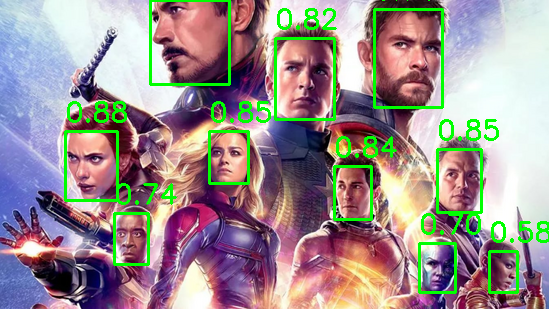

In [18]:
img_copy = img.copy()
embs = []
# Assuming face_rec_model is your FaceAnalysis object
faces = face_rec_model.get(img)  # Get the detected faces and assign to faces variable

for face in faces:
    bbox = face.bbox
    embedding = face.normed_embedding
    embs.append(embedding)

    cv2.rectangle(img_copy, (int(bbox[0]), int(bbox[1])), (int(bbox[2]), int(bbox[3])), (0, 255, 0), 2)

    cv2.putText(img_copy, f"{face.det_score:.2f}", (int(bbox[0]), int(bbox[1]) - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

cv2_imshow(img_copy)

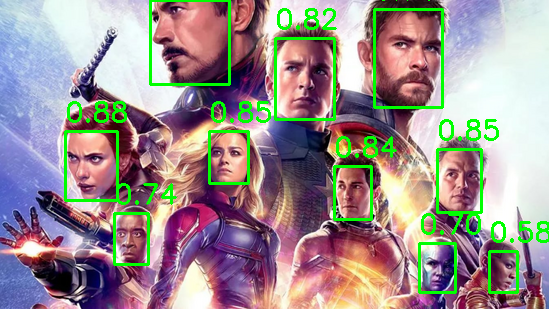

In [22]:
faces = face_rec_model.get(img)
img_copy = img.copy()
embs = []
for face in faces:
    bbox = face.bbox
    embedding = face.normed_embedding
    embs.append(embedding)

    cv2.rectangle(img_copy, (int(bbox[0]), int(bbox[1])), (int(bbox[2]), int(bbox[3])), (0, 255, 0), 2)

    cv2.putText(img_copy, f"{face.det_score:.2f}", (int(bbox[0]), int(bbox[1]) - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

cv2_imshow(img_copy)

In [26]:
from pathlib import Path
imgs = Path("/content/Screenshot_2023-06-02_105309_1685683406455_1698859576740(1).png") # Change imgs to Path object
img_paths = list(imgs.iterdir())
import matplotlib.pyplot as plt
plt.figure(figsize=(5, 5))

for i, img_path in enumerate(img_paths):
  plt.subplot(1, 3, i+1)
  plt.imshow(plt.imread(img_path))
  plt.axis("off")
img_paths = list(imgs.iterdir())
embs = []
box_score_path = []
for img_path in img_paths:
  img = cv2.imread(str(img_path))
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  faces = face_rec_model.get(img_rgb)
  for face in faces:
    bbox = face.bbox

NotADirectoryError: [Errno 20] Not a directory: '/content/Screenshot_2023-06-02_105309_1685683406455_1698859576740(1).png'